In [46]:
pip install osmnx geopandas requests descartes contextily tqdm

Note: you may need to restart the kernel to use updated packages.


In [47]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')
from matplotlib.patches import PathPatch
from matplotlib.path import Path


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/736540332.py:11: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [48]:
PLACE_NAME = 'Florence, Italy'
name = 'Florence'
grid_size = 500

epsg:4326
EPSG:32632


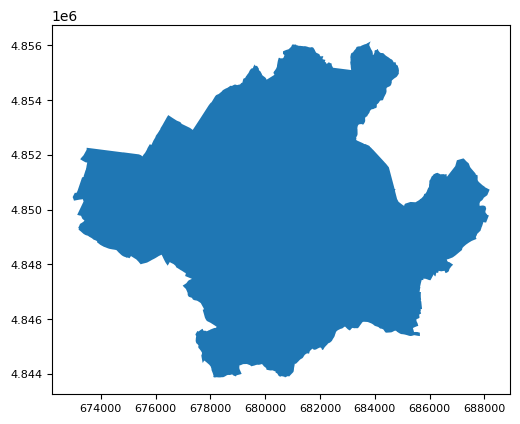

<class 'shapely.geometry.polygon.Polygon'>


In [49]:
florence = ox.geocode_to_gdf(PLACE_NAME)
print(florence.crs)
# changing CRS for grid division
florence = ox.project_gdf(florence) 
print(florence.crs)

# Plot and store the axis object
ax = florence.plot()

# Customize the font size of the tick labels on the axes
ax.tick_params(axis='both', which='major', labelsize=8)

# Display the plot
plt.show()

# Print the type of geometry for your information
geometry = florence['geometry'].iloc[0]
print(type(geometry))

In [50]:
#save geometry
#florence.to_file(f"D:/charging_stations/task2/map/{florence}.shp")

Division into grid

In [51]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


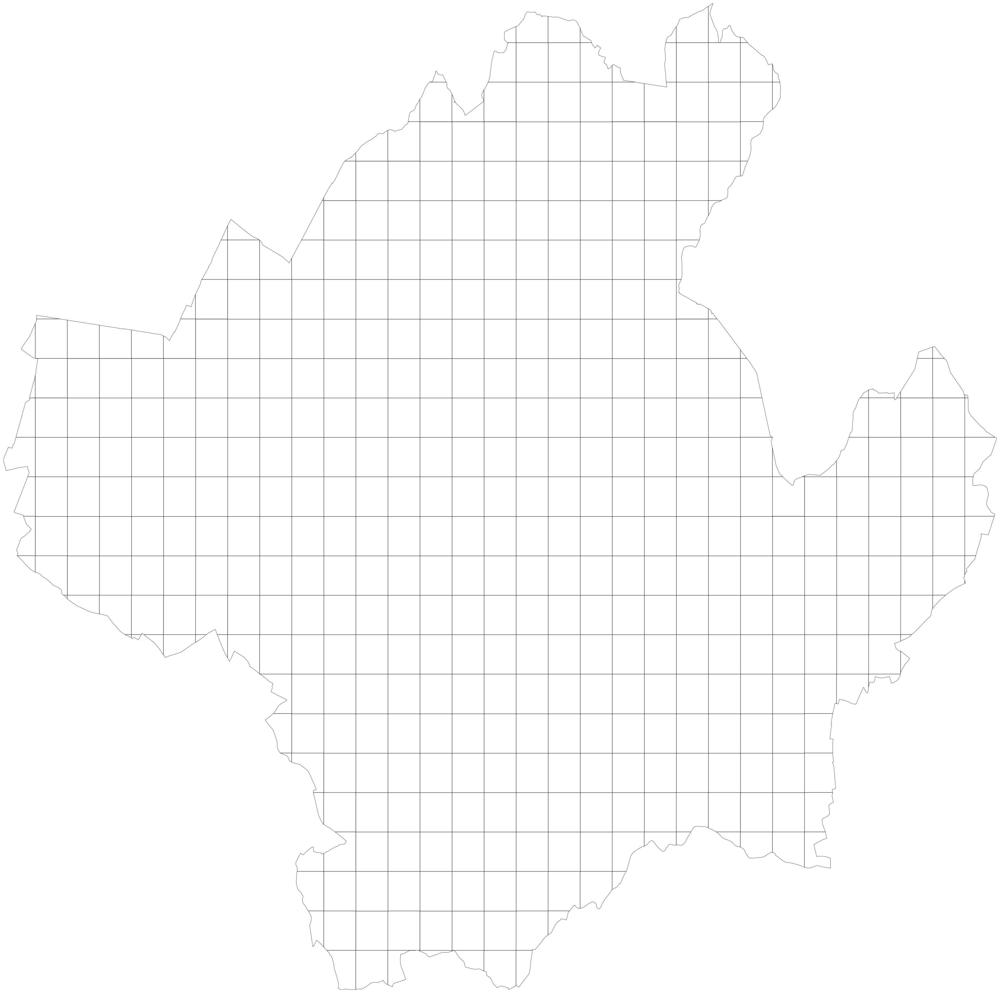

In [52]:
import shapely.geometry as sg
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = florence.unary_union.bounds

# Manual patch creation
fig, ax = plt.subplots(figsize=(40, 40))
for polygon in geometry_cut.geoms:
    if isinstance(polygon, sg.Polygon) and not polygon.is_empty:
        verts = np.array(polygon.exterior.coords)
        codes = np.full(len(verts), Path.LINETO)
        codes[0] = Path.MOVETO
        codes[-1] = Path.CLOSEPOLY
        path = Path(verts, codes)
        patch = PathPatch(path, facecolor='white', edgecolor='black', alpha=0.5)
        ax.add_patch(patch)

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [53]:
florence_polyframe = gpd.GeoDataFrame(geometry=polylist)
florence_polyframe.crs = florence.crs
print(florence_polyframe.crs)
florence_polyframe.head()

EPSG:32632


,geometry
0,"POLYGON ((672972.426 4850455.755, 672972.694 4..."
1,"POLYGON ((673167.509 4850742.430, 673312.806 4..."
2,"POLYGON ((673376.832 4851233.127, 673376.568 4..."
3,"POLYGON ((673463.493 4850251.734, 673463.493 4..."
4,"POLYGON ((673463.493 4849761.037, 673463.493 4..."


(5423117.721175897, 5440014.925075844)

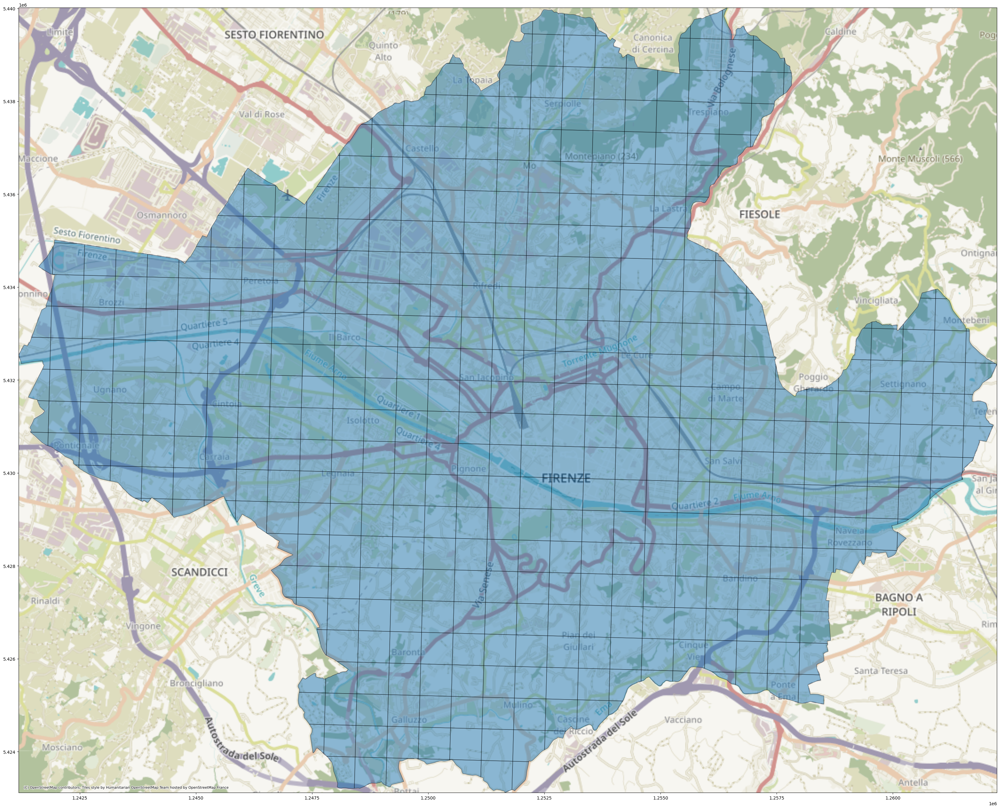

In [54]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = florence_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

## POIs

In [55]:
florence_polyframe_lat_long = ox.project_gdf(florence_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
florence_polyframe_lat_long.head()

,geometry
0,"POLYGON ((11.14976 43.78695, 11.14977 43.78701..."
1,"POLYGON ((11.15228 43.78948, 11.15422 43.79330..."
2,"POLYGON ((11.15503 43.79384, 11.15503 43.79394..."
3,"POLYGON ((11.15579 43.78499, 11.15563 43.78058..."
4,"POLYGON ((11.15563 43.78058, 11.15548 43.77616..."


# EV Stations

In [56]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)

In [57]:
EV_stations.head()

amenity capacity  \
element_type osmid                                  
node         297935865  charging_station        2   
             303131495  charging_station        2   
             310130266  charging_station        1   
             312870286  charging_station      NaN   
             312890326  charging_station      NaN   

                                                      name  \
element_type osmid                                           
node         297935865  Colonnina ricarica mezzi elettrici   
             303131495                                 NaN   
             310130266  Colonnina ricarica mezzi elettrici   
             312870286  colonnina ricarica mezzi elettrici   
             312890326  Colonnina ricarica mezzi elettrici   

                                         geometry  brand natural source  \
element_type osmid                                                        
node         297935865  POINT (11.19409 43.77637)    NaN     NaN    NaN   
             303131495  POINT (11.19116 43.77856)  SILFI     NaN    NaN   
             310130266  POINT (11.21649 43.77814)  SILFI     NaN    NaN   
             312870286  POINT (11.23817 43.79602)  SILFI     NaN    NaN   
             312890326  POINT (11.23880 43.78188)  SILFI     NaN    NaN   

                       species motorcar opening_hours  ... description  car  \
element_type osmid                                     ...                    
node         297935865     NaN      NaN           NaN  ...         NaN  NaN   
             303131495     NaN      NaN           NaN  ...         NaN  NaN   
             310130266     NaN      NaN           NaN  ...         NaN  NaN   
             312870286     NaN      NaN           NaN  ...         NaN  NaN   
             312890326     NaN      NaN           NaN  ...         NaN  NaN   

                       brand:wikidata operator:wikidata  fee socket:chademo  \
element_type osmid                                                            
node         297935865            NaN               NaN  NaN            NaN   
             303131495            NaN               NaN  NaN            NaN   
             310130266            NaN               NaN  NaN            NaN   
             312870286            NaN               NaN  NaN            NaN   
             312890326            NaN               NaN  NaN            NaN   

                       socket:type2:output access bicycle socket:typee  
element_type osmid                                                      
node         297935865                 NaN    NaN     NaN          NaN  
             303131495                 NaN    NaN     NaN          NaN  
             310130266                 NaN    NaN     NaN          NaN  
             312870286                 NaN    NaN     NaN          NaN  
             312890326                 NaN    NaN     NaN          NaN  

[5 rows x 31 columns]

Text(0.5, 1.0, 'Florence EV stations')

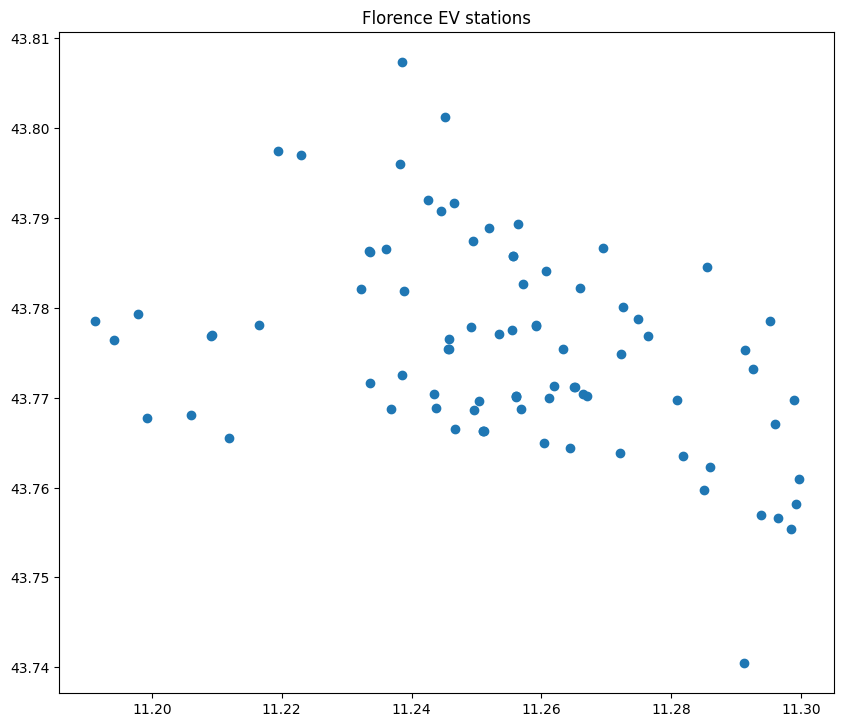

In [58]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Florence EV stations")

Text(0.5, 1.0, 'Florence EV stations')

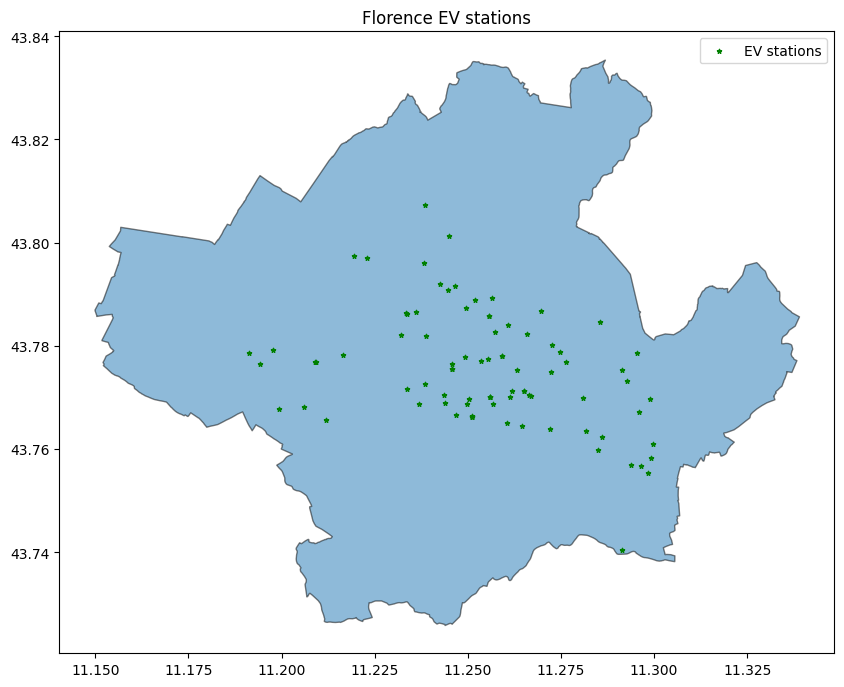

In [59]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(florence, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title("Florence EV stations")

In [60]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,florence_polyframe.shape[0])):
    pip_mask = EV_stations.within(florence_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/1437531433.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 501/501 [00:00<00:00, 33067.59it/s]


In [61]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,florence_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['geometry']]], ignore_index=True)

100%|██████████| 501/501 [00:00<00:00, 2692.68it/s]


In [62]:
florence_polyframe_lat_long_new = florence_polyframe_lat_long.copy()
florence_polyframe_lat_long_new['EV_stations_counts'] = 0
florence_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [63]:
for i in tqdm(range(0,florence_polyframe_lat_long_new.shape[0])):
    florence_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    florence_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

  0%|          | 0/501 [00:00<?, ?it/s]/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/25321340.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  florence_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())
100%|██████████| 501/501 [00:00<00:00, 1941.41it/s]


In [64]:
#How many EV stations in each grid
florence_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
florence_polyframe_lat_long_new['EV_stations_counts'].value_counts() / florence_polyframe_lat_long_new.shape[0]

EV_stations_counts
0    0.886228
1    0.081836
2    0.019960
3    0.005988
4    0.003992
6    0.001996
Name: count, dtype: float64

In [65]:
florence_polyframe_lat_long_new.head(5)

,geometry,EV_stations_counts,EV_stations_geomery
0,"POLYGON ((11.14976 43.78695, 11.14977 43.78701...",0,[]
1,"POLYGON ((11.15228 43.78948, 11.15422 43.79330...",0,[]
2,"POLYGON ((11.15503 43.79384, 11.15503 43.79394...",0,[]
3,"POLYGON ((11.15579 43.78499, 11.15563 43.78058...",0,[]
4,"POLYGON ((11.15563 43.78058, 11.15548 43.77616...",0,[]


# Population data visualize and add to each grid

In [66]:
df_pop = pd.read_csv("/Users/claudiacortese/Desktop/ita_general_2020.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.longitude, df_pop.latitude))

In [67]:
df_pop.head()

,longitude,latitude,ita_general_2020
0,6.215694,48.000139,1.061017
1,6.216250,48.000139,1.061017
2,6.216528,48.000139,1.061017
3,6.243750,48.000139,0.831058
4,6.244028,48.000139,0.831058


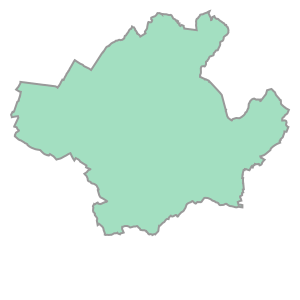

In [68]:
#extract population data for Florence
florence.geometry[0]

In [69]:
# change crs to lat long
florence_lat_long = ox.project_gdf(florence, to_latlong=True)
pip_mask = gdf.within(florence_lat_long.loc[0, 'geometry'])

In [70]:
florence_pop_gdf = gdf.loc[pip_mask]

<Axes: >

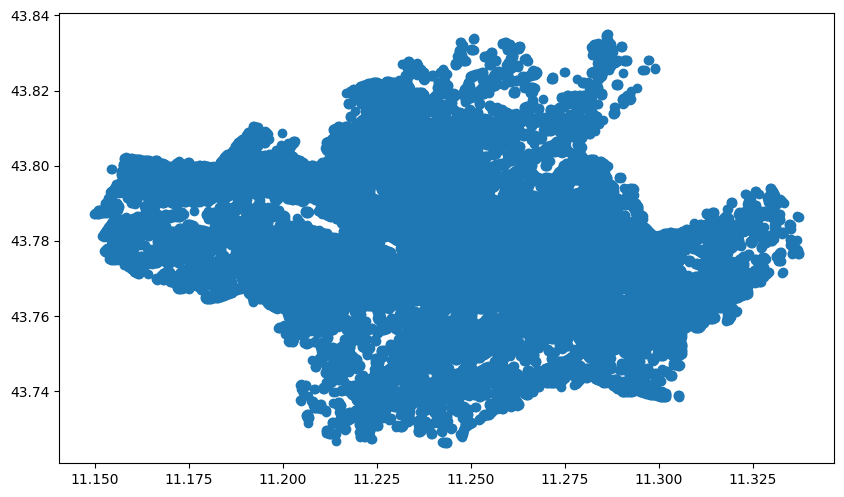

In [71]:
#plot population data with cmap
florence_pop_gdf.plot(figsize=(10,10))

In [74]:
florence_pop_gdf.to_csv(f"/Users/claudiacortese/Desktop/{name}-population.csv")

In [75]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,florence_polyframe_lat_long.shape[0])):
    pip_mask = florence_pop_gdf.within(florence_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 501/501 [00:00<00:00, 513.31it/s]


In [76]:
pop_grid = []
for i in range(0,florence_polyframe_lat_long.shape[0]):
    pop_grid.append(florence_pop_gdf.loc[masks_pop[i]].ita_general_2020.mean())

In [77]:
pop_grid = np.nan_to_num(pop_grid)

In [78]:
florence_polyframe_lat_long_new['population'] = pop_grid
florence_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population
0,"POLYGON ((11.14976 43.78695, 11.14977 43.78701...",0,[],0.055365
1,"POLYGON ((11.15228 43.78948, 11.15422 43.79330...",0,[],0.379845
2,"POLYGON ((11.15503 43.79384, 11.15503 43.79394...",0,[],1.814465
3,"POLYGON ((11.15579 43.78499, 11.15563 43.78058...",0,[],0.245168
4,"POLYGON ((11.15563 43.78058, 11.15548 43.77616...",0,[],0.219274


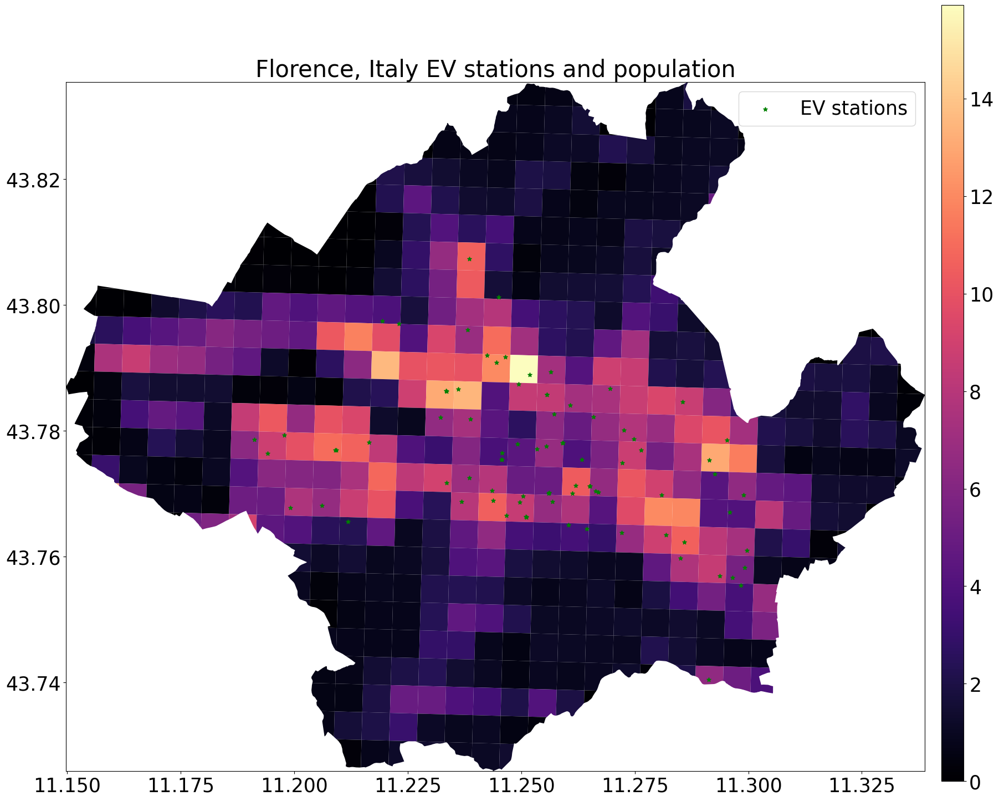

In [79]:
plt.rcParams.update({'font.size':25})
west, south, east, north = florence_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
florence_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=30, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(florence_polyframe_lat_long_new.population), vmax=max(florence_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

# Land Use

In [80]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/4238397865.py:1: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})


In [82]:
landuse.to_csv(f"/Users/claudiacortese/Desktop/{name}-landuse.csv")

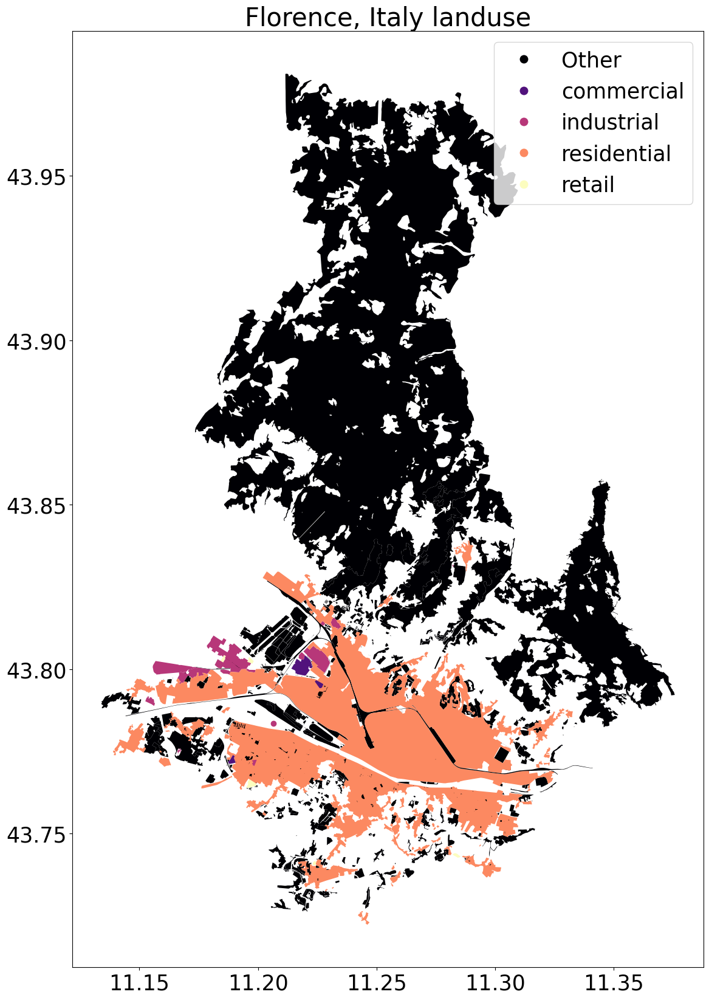

In [83]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [84]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [85]:
import shapely.speedups
shapely.speedups.enable()

/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/3808896212.py:2: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [86]:
masks_land_use = []
for i in tqdm(range(0,florence_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(florence_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 501/501 [00:00<00:00, 8075.33it/s]


In [87]:
land_labels = []
for i in range(0,florence_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [88]:
florence_polyframe_lat_long_new['landuse'] = land_labels

In [89]:
florence_polyframe_lat_long_new.landuse.value_counts()

landuse
Other          489
residential      9
industrial       3
Name: count, dtype: int64

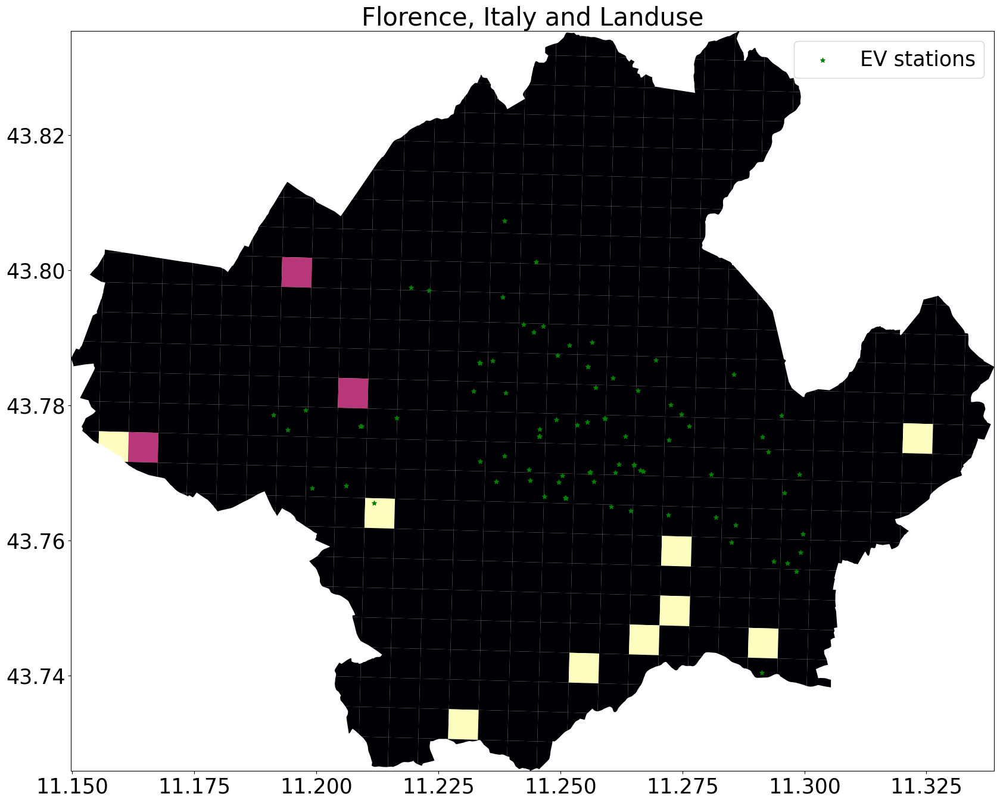

In [90]:
plt.rcParams.update({'font.size':25})
west, south, east, north = florence_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
florence_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=30, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

In [91]:
florence_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse
0,"POLYGON ((11.14976 43.78695, 11.14977 43.78701...",0,[],0.055365,Other
1,"POLYGON ((11.15228 43.78948, 11.15422 43.79330...",0,[],0.379845,Other
2,"POLYGON ((11.15503 43.79384, 11.15503 43.79394...",0,[],1.814465,Other
3,"POLYGON ((11.15579 43.78499, 11.15563 43.78058...",0,[],0.245168,Other
4,"POLYGON ((11.15563 43.78058, 11.15548 43.77616...",0,[],0.219274,Other


## Road Connectivity

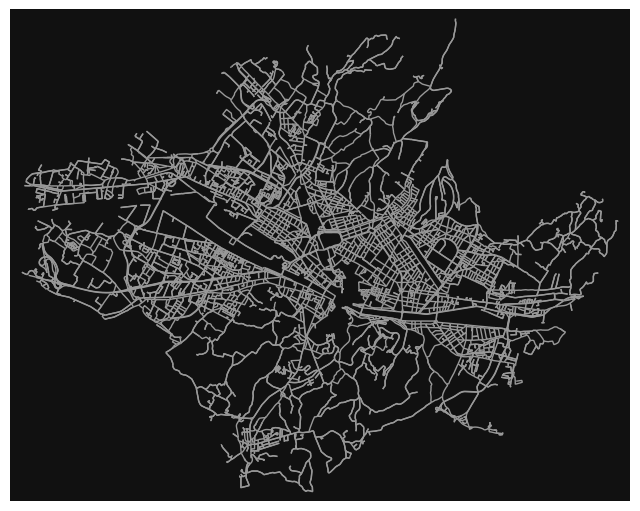

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [92]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [93]:
area,edges = ox.graph_to_gdfs(G)

In [94]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,florence_polyframe_lat_long.shape[0])):
    try: 
        poly = florence_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)

100%|██████████| 501/501 [09:20<00:00,  1.12s/it]


In [95]:
#add nodes, edges and density to the dataframe
florence_polyframe_lat_long_new['nodes'] = nodes
florence_polyframe_lat_long_new['edges'] = edges
florence_polyframe_lat_long_new['density'] = density

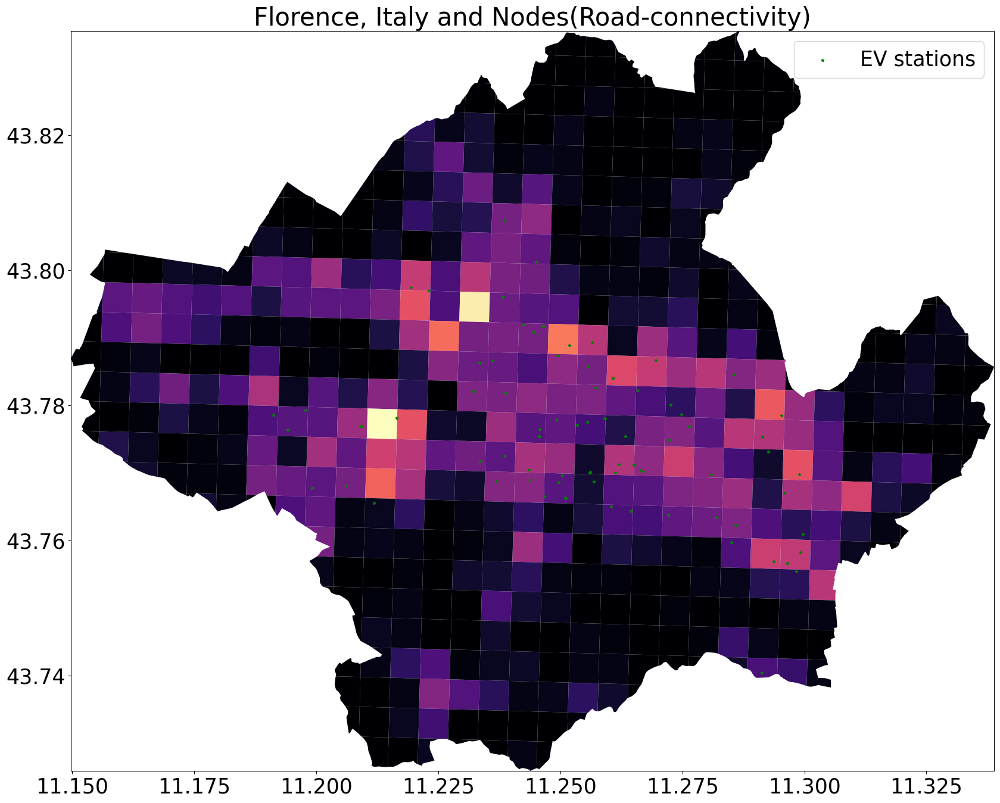

In [96]:
# relation between EVCSs and nodes
plt.rcParams.update({'font.size':25})
west, south, east, north = florence_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
florence_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

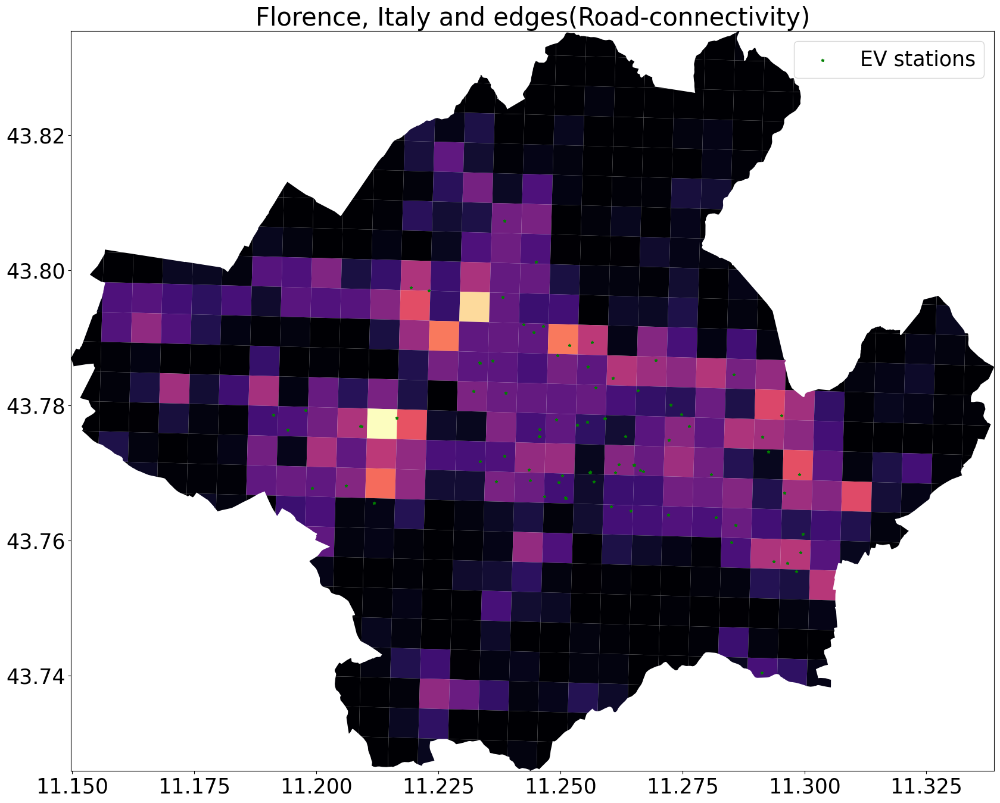

In [97]:
plt.rcParams.update({'font.size':25})
west, south, east, north = florence_polyframe_lat_long_new.unary_union.bounds

#edges
fig, ax = plt.subplots(figsize=(20,20))
florence_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

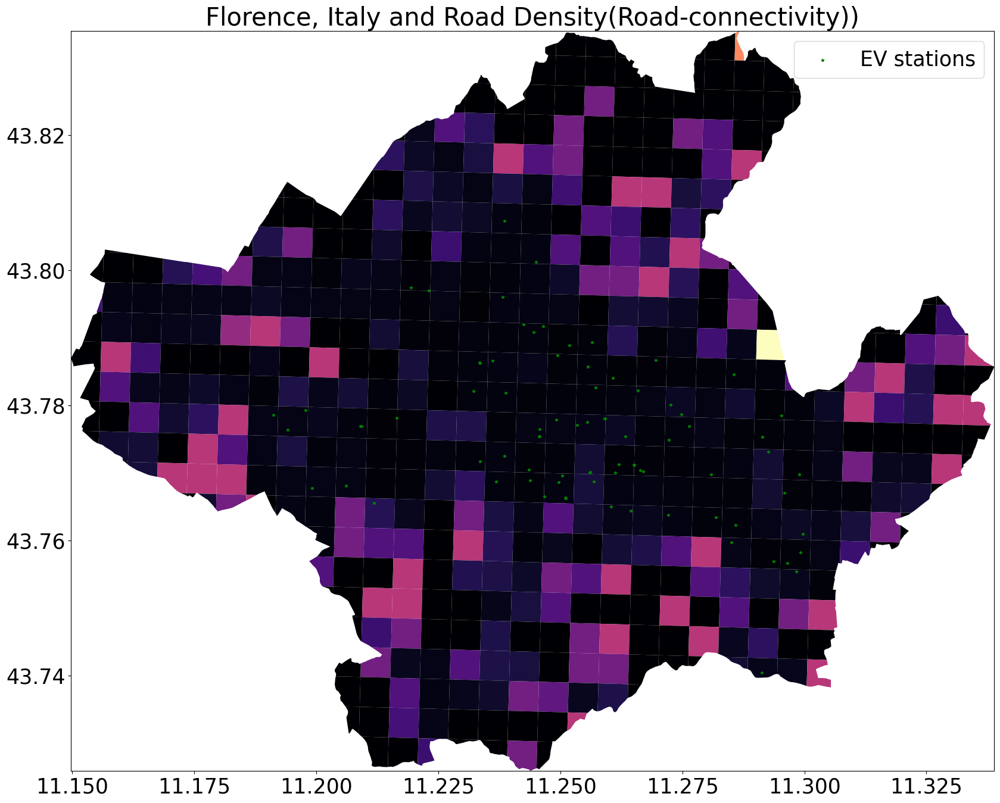

In [98]:
plt.rcParams.update({'font.size':25})
west, south, east, north = florence_polyframe_lat_long_new.unary_union.bounds

#density
fig, ax = plt.subplots(figsize=(20,20))
florence_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [99]:
florence_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse,nodes,edges,density
0,"POLYGON ((11.14976 43.78695, 11.14977 43.78701...",0,[],0.055365,Other,0,0,0.000000
1,"POLYGON ((11.15228 43.78948, 11.15422 43.79330...",0,[],0.379845,Other,0,0,0.000000
2,"POLYGON ((11.15503 43.79384, 11.15503 43.79394...",0,[],1.814465,Other,4,5,0.416667
3,"POLYGON ((11.15579 43.78499, 11.15563 43.78058...",0,[],0.245168,Other,0,0,0.000000
4,"POLYGON ((11.15563 43.78058, 11.15548 43.77616...",0,[],0.219274,Other,0,0,0.000000


# POIs

In [100]:
import osmnx as ox
import pandas as pd
from tqdm import tqdm

def count_features_in_grids(place_name, features, city_polyframe, dataframe_name):
    for feature_key, feature_list in features.items():
        for feature in feature_list:
            try:
                # Fetch geometries from OpenStreetMap
                geometries = ox.geometries_from_place(
                    place_name,
                    {feature_key: feature}
                )
                # Export to CSV if geometries are found
                if not geometries.empty:
                    geometries.to_csv(f"D:/charging_stations/task2/dataset/Florence-{feature}.csv")

                    # Create masks for each grid
                    masks = []
                    for i in tqdm(range(0, city_polyframe.shape[0]), desc=f"Processing masks for {feature}"):
                        pip_mask = geometries.within(city_polyframe.loc[i, 'geometry'])
                        masks.append(pip_mask)

                    # Count features in each grid
                    feature_counts = []
                    for i in tqdm(range(0, city_polyframe.shape[0]), desc=f"Counting {feature}"):
                        feature_counts.append(geometries[masks[i]].shape[0])

                    # Add counts to the dataframe
                    dataframe_name[f'{feature}_count'] = feature_counts
                else:
                    print(f"No data found for {feature_key}='{feature}' in {place_name}.")
            except Exception as e:
                print(f"Failed to process {feature_key}='{feature}' in {place_name}: {str(e)}")

In [101]:
features = {
    'amenity': ['school', 'university', 'restaurant', 'place_of_worship', 
                'community_centre', 'townhall', 'parking', 'library'],
    'leisure': ['park', 'cinema'],
    'building': ['commercial', 'government', 'civic', 'retail']
}

city_polyframe = florence_polyframe_lat_long_new

count_features_in_grids(PLACE_NAME, features, city_polyframe, florence_polyframe_lat_long_new)

/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='school' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='university' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='restaurant' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='place_of_worship' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='community_centre' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='townhall' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='parking' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process amenity='library' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process leisure='park' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process leisure='cinema' in Florence, Italy: No data elements in server response. Check log and query location/tags.


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process building='commercial' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process building='government' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process building='civic' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


/var/folders/nh/9d8r8prn3819gz07wlp9htdw0000gn/T/ipykernel_92752/366611866.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(


Failed to process building='retail' in Florence, Italy: Cannot save file into a non-existent directory: 'D:/charging_stations/task2/dataset'


In [102]:
florence_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,"POLYGON ((11.1497598 43.786945100000004, 11.14...",POLYGON ((11.152275263592015 43.78947883585293...,POLYGON ((11.155033799997009 43.79384484859729...,POLYGON ((11.155792683496708 43.78499449246358...,POLYGON ((11.155633965254182 43.78057946423902...
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.055365,0.379845,1.814465,0.245168,0.219274
landuse,Other,Other,Other,Other,Other
nodes,0,0,4,0,0
edges,0,0,5,0,0
density,0.0,0.0,0.416667,0.0,0.0


## Traffic

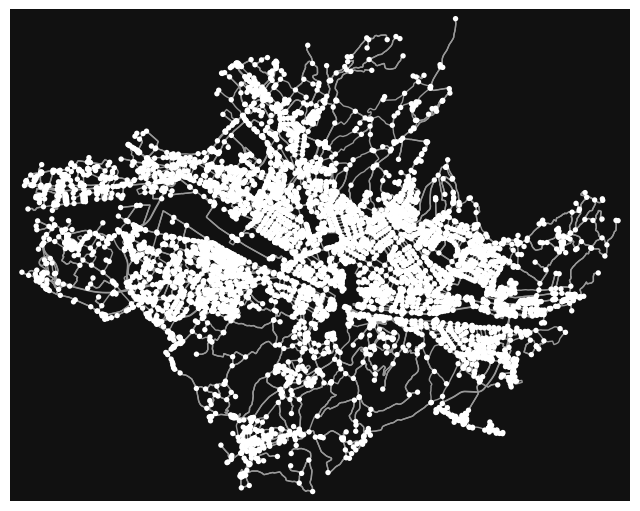

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [103]:
# Fetch road network data
florence_graph = ox.graph_from_place(PLACE_NAME, network_type='drive')

# Visualize the road network
ox.plot_graph(florence_graph)

In [104]:
# Convert the graph to edge GeoDataFrame
edges = ox.graph_to_gdfs(florence_graph, nodes=False, edges=True)

In [105]:
selected_columns = edges[['osmid', 'oneway', 'lanes', 'highway', 'maxspeed', 
                          'geometry']]

In [106]:
selected_columns.head()

osmid  oneway   lanes     highway  \
u      v         key                                                       
917534 298526371 0    [1009678621, 27204439]    True  [1, 2]     primary   
917599 298525095 0                  28558065    True     NaN    tertiary   
917881 246998242 0                  22930152    True     NaN  trunk_link   
       269342232 0                 180715240   False       4   secondary   
       246998274 0    [638029785, 638029787]   False       4   secondary   

                     maxspeed  \
u      v         key            
917534 298526371 0        NaN   
917599 298525095 0         50   
917881 246998242 0         30   
       269342232 0         50   
       246998274 0         50   

                                                               geometry  
u      v         key                                                     
917534 298526371 0    LINESTRING (11.28719 43.74146, 11.28735 43.741...  
917599 298525095 0    LINESTRING (11.29063 43.74342, 11.29038 43.743...  
917881 246998242 0    LINESTRING (11.30070 43.75655, 11.30079 43.756...  
       269342232 0    LINESTRING (11.30070 43.75655, 11.30064 43.756...  
       246998274 0    LINESTRING (11.30070 43.75655, 11.30118 43.756...

In [107]:
# Drop rows where any cell in that row is NA
selected_columns = selected_columns.dropna()

In [108]:
# Convert road network to a projected CRS
road_network = selected_columns.to_crs(epsg=32633)

# Also ensure your polygons are in the same CRS
florence_polyframe_lat_long_new = florence_polyframe_lat_long_new.to_crs(epsg=32633)

In [109]:
# Calculate centroids safely
road_centers = road_network.centroid

In [110]:
def check_one_way(polygon, roads):
    # Recalculate centroids here if necessary
    road_centers = roads.centroid  # Ensure 'roads' is already in a projected CRS
    within_mask = road_centers.within(polygon)
    one_way_roads = roads[within_mask & roads['oneway']]
    return 'Yes' if not one_way_roads.empty else 'No'

# Apply the function
florence_polyframe_lat_long_new['oneway_exists'] = florence_polyframe_lat_long_new['geometry'].apply(check_one_way, roads=road_network)

In [111]:
florence_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,POLYGON ((190197.79642455757 4855418.303914024...,POLYGON ((190413.30977452965 4855690.313606118...,POLYGON ((190657.83061832457 4856164.938966472...,"POLYGON ((190673.1779001825 4855179.05095902, ...",POLYGON ((190637.60410776787 4854689.248399376...
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.055365,0.379845,1.814465,0.245168,0.219274
landuse,Other,Other,Other,Other,Other
nodes,0,0,4,0,0
edges,0,0,5,0,0
density,0.0,0.0,0.416667,0.0,0.0
oneway_exists,No,No,No,No,No


In [112]:
def check_highways(polygon, roads):
    # Calculate centroids for the roads and check if they fall within the given polygon
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    highways_within = roads.loc[within_mask, 'highway']

    # Flatten the list of highways if they are stored in lists within cells
    flattened_highways = []
    for item in highways_within.dropna():
        if isinstance(item, list):
            flattened_highways.extend(item)  # Extend the flat list with elements of the sublist
        else:
            flattened_highways.append(item)  # Append the item directly if it's not a list

    # Create a set of unique highway types, removing duplicates and handling unhashable types
    unique_highways = set(flattened_highways)
    return unique_highways if unique_highways else 'None'

In [113]:
florence_polyframe_lat_long_new['highway_types'] = florence_polyframe_lat_long_new['geometry'].apply(check_highways, roads=road_network)

In [114]:
florence_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,POLYGON ((190197.79642455757 4855418.303914024...,POLYGON ((190413.30977452965 4855690.313606118...,POLYGON ((190657.83061832457 4856164.938966472...,"POLYGON ((190673.1779001825 4855179.05095902, ...",POLYGON ((190637.60410776787 4854689.248399376...
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.055365,0.379845,1.814465,0.245168,0.219274
landuse,Other,Other,Other,Other,Other
nodes,0,0,4,0,0
edges,0,0,5,0,0
density,0.0,0.0,0.416667,0.0,0.0
oneway_exists,No,No,No,No,No
highway_types,None,None,None,None,None


In [115]:
def aggregate_lanes(polygon, roads):
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    lanes_within = roads.loc[within_mask, 'lanes'].dropna()
    # Convert data to numeric, because 'lanes' might be stored as strings
    lanes_within = pd.to_numeric(lanes_within, errors='coerce')
    return lanes_within.mean()  # You could also consider sum, max, or other aggregations

In [116]:
florence_polyframe_lat_long_new['average_lanes'] = florence_polyframe_lat_long_new['geometry'].apply(aggregate_lanes, roads=road_network)

In [117]:
def aggregate_maxspeed(polygon, roads):
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    maxspeed_within = roads.loc[within_mask, 'maxspeed'].dropna()
    
    # Process each maxspeed entry, whether list or string, to get numeric values
    def process_maxspeed_entry(entry):
        if isinstance(entry, list):
            # Assuming the list has a string with the first element as the speed
            return pd.to_numeric(entry[0].split(' ')[0], errors='coerce')
        elif isinstance(entry, str):
            return pd.to_numeric(entry.split(' ')[0], errors='coerce')
        else:
            return pd.NA  # Pandas' NA for missing type-aware handling

    # Apply processing function to each item in the series
    maxspeed_numeric = maxspeed_within.apply(process_maxspeed_entry)
    return maxspeed_numeric.mean()  # Calculate mean of the cleaned, numeric maxspeed values

In [118]:
florence_polyframe_lat_long_new['average_maxspeed'] = florence_polyframe_lat_long_new['geometry'].apply(aggregate_maxspeed, roads=road_network)

In [119]:
florence_polyframe_lat_long_new['city'] = 'Florence'

In [120]:
florence_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,POLYGON ((190197.79642455757 4855418.303914024...,POLYGON ((190413.30977452965 4855690.313606118...,POLYGON ((190657.83061832457 4856164.938966472...,"POLYGON ((190673.1779001825 4855179.05095902, ...",POLYGON ((190637.60410776787 4854689.248399376...
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.055365,0.379845,1.814465,0.245168,0.219274
landuse,Other,Other,Other,Other,Other
nodes,0,0,4,0,0
edges,0,0,5,0,0
density,0.0,0.0,0.416667,0.0,0.0
oneway_exists,No,No,No,No,No
highway_types,None,None,None,None,None


In [121]:
# Save the updated DataFrame to a CSV file
florence_polyframe_lat_long_new.to_csv(r"D:\BIG_DATA\charging_stations\task_2\florence.csv", index=False)